In [1]:
import glob
import pandas as pd
import numpy as np
import cartopy.crs as ccrs

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.backends.backend_pdf as pdf
from matplotlib.colors import LinearSegmentedColormap as lsc
%matplotlib inline

In [2]:
# Define variables
DIR_OUTPUT = "./output/"
DIR_RAW_INPUT = "./raw_data/"

startingLon = 330
eastrange = 150

figsize = (19.53/2, 18.55/2)
img_extent = (-180, 180, -90, 90)

In [3]:
# Define function to save images in a standardized way 

def set_save_image(fig, savename, dpi=600, show=False):
    # Output text as editable PDF text objects instead of shapes
    matplotlib.rcParams['pdf.fonttype'] = 42
    
    # Force PDF to respect zorder by supressing image compositing
    matplotlib.rcParams['image.composite_image'] = False

    # Remove borders on the plot axes
    for ax in fig.get_axes():
        ax.set_xticks([])
        ax.set_yticks([])
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        try:
            ax.set_global()
            ax.background_patch.set_fill(False)
        except:
            pass

    # Remove all padding and margins
    plt.subplots_adjust(top=1, bottom=0, right=1, left=0, hspace=0, wspace=0)
    plt.margins(0,0)
    plt.gca().xaxis.set_major_locator(matplotlib.pyplot.NullLocator())
    plt.gca().yaxis.set_major_locator(matplotlib.pyplot.NullLocator())
        
    if savename.split('.')[-1] == 'pdf':
        pp = pdf.PdfPages(savename, keep_empty=False)
        pp.savefig(fig)
        pp.close()
    elif savename.split('.')[-1] == 'png':
        plt.savefig(savename, format='png', dpi=dpi, pad_inches=0, transparent=True)
    else:
        print("Unrecognized file format, plot not saved!")

    if show == True: 
        plt.show()
    plt.clf()
    plt.close('all')

Processing ortho [340, 20]	filename: ./output/july_340_earth.png


<ipython-input-3-3042689de78e>:20: DeprecationWarning: The background_patch property is deprecated. Use GeoAxes.patch instead.
  ax.background_patch.set_fill(False)


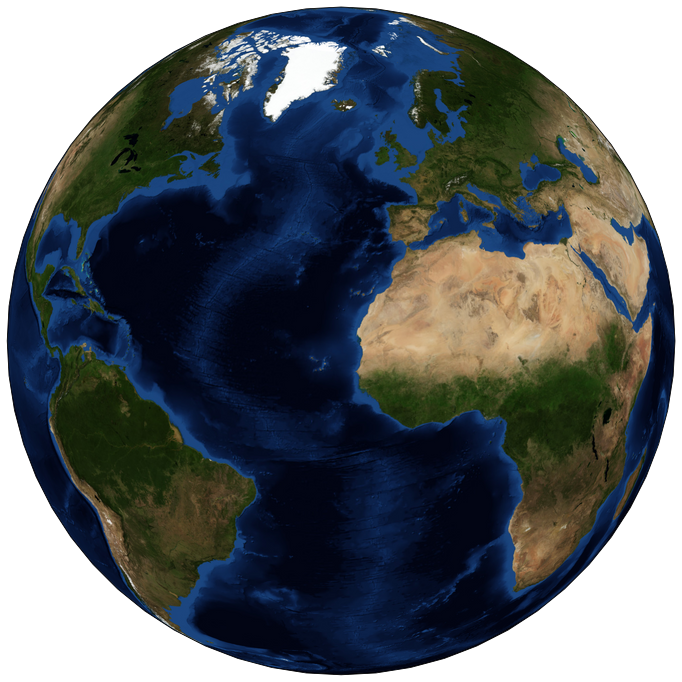

Processing ortho [350, 20]	filename: ./output/july_350_earth.png


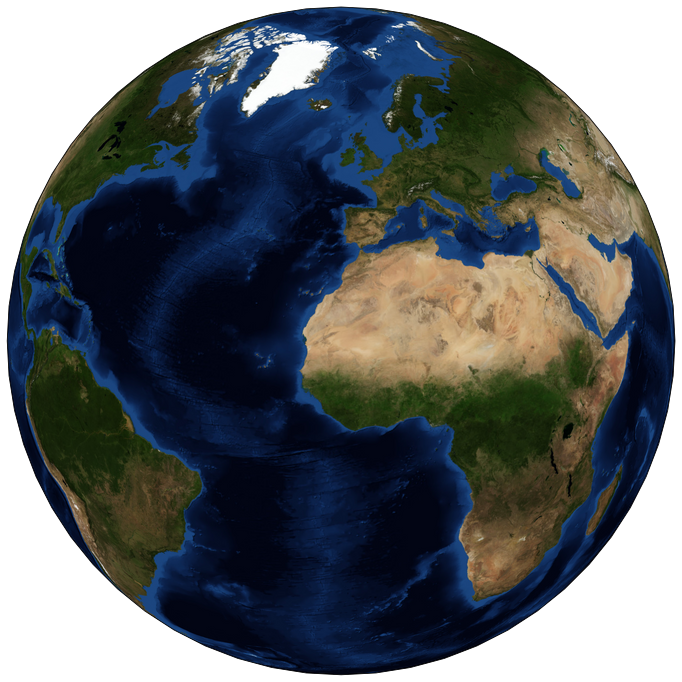

Processing ortho [0, 20]	filename: ./output/july_0_earth.png


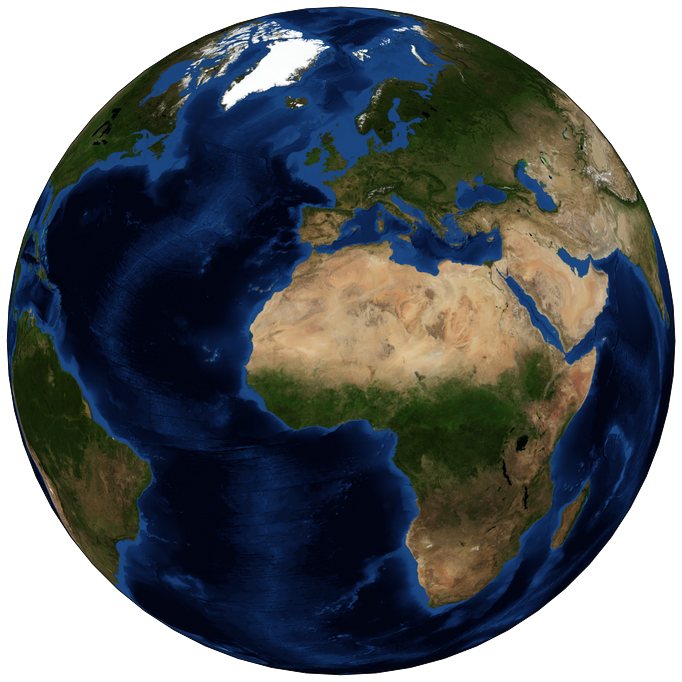

Processing ortho [10, 20]	filename: ./output/july_10_earth.png


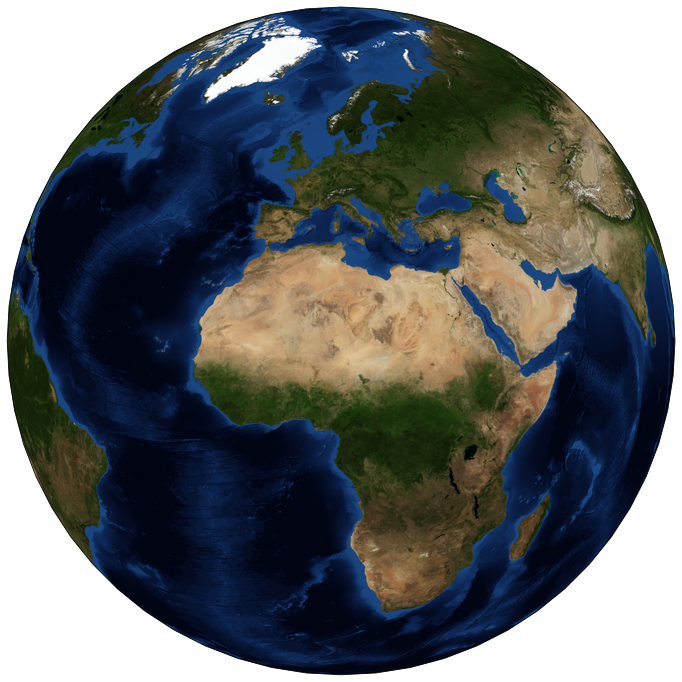

Processing ortho [20, 20]	filename: ./output/july_20_earth.png


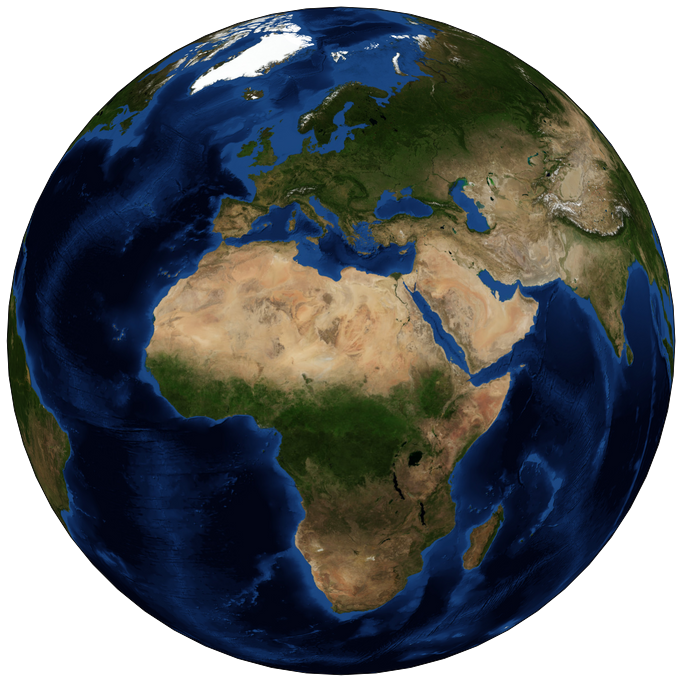

Processing ortho [30, 20]	filename: ./output/july_30_earth.png


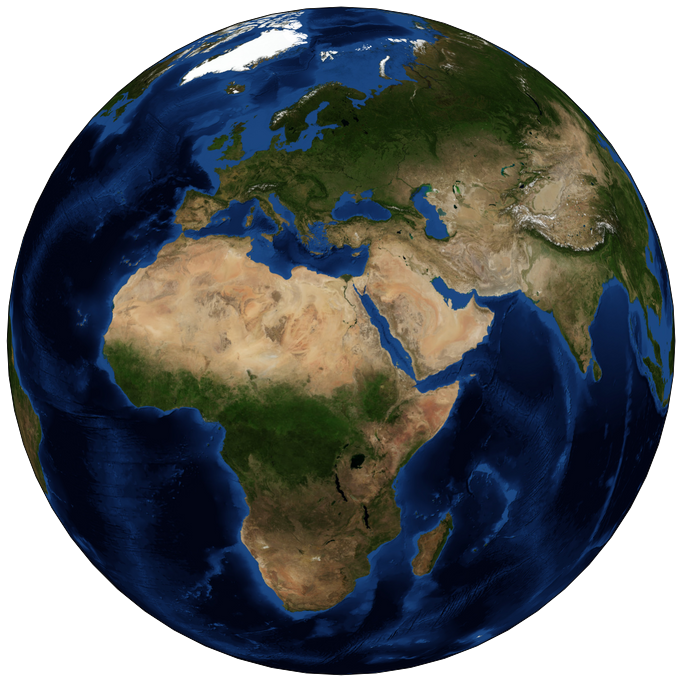

Processing ortho [40, 20]	filename: ./output/july_40_earth.png


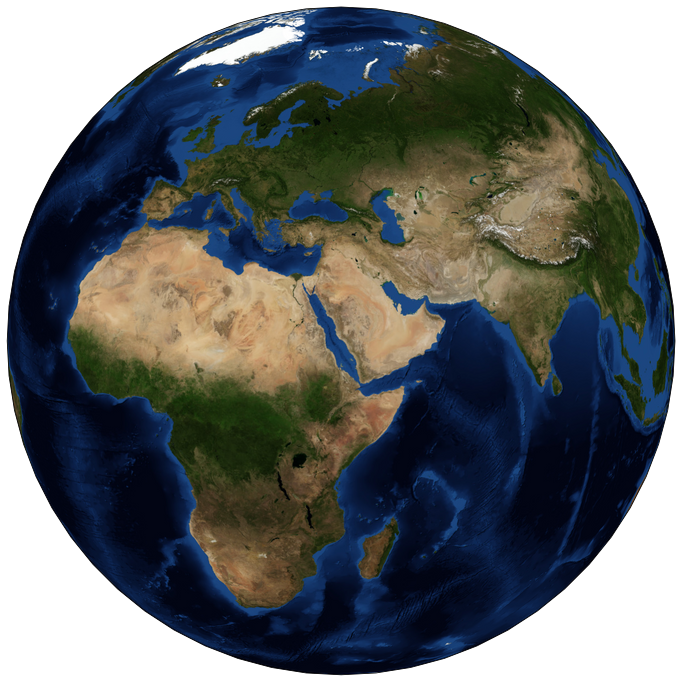

Processing ortho [50, 20]	filename: ./output/july_50_earth.png


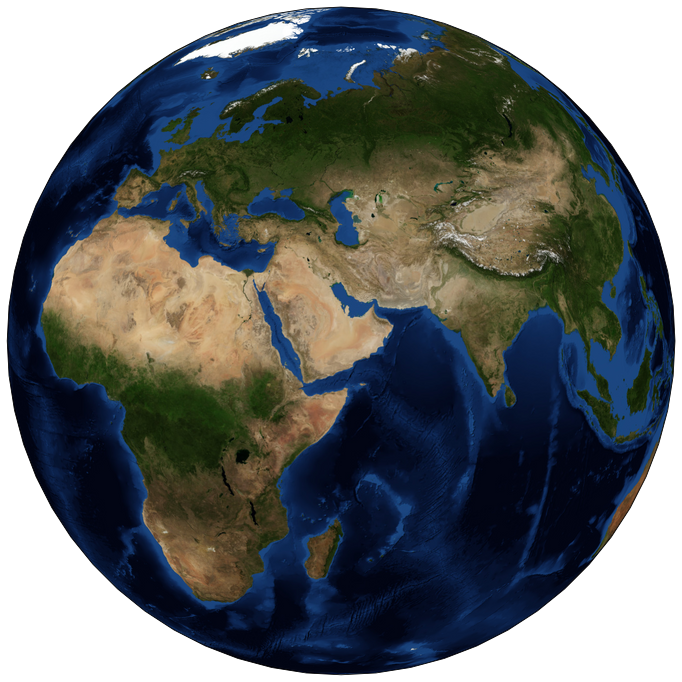

Processing ortho [60, 20]	filename: ./output/july_60_earth.png


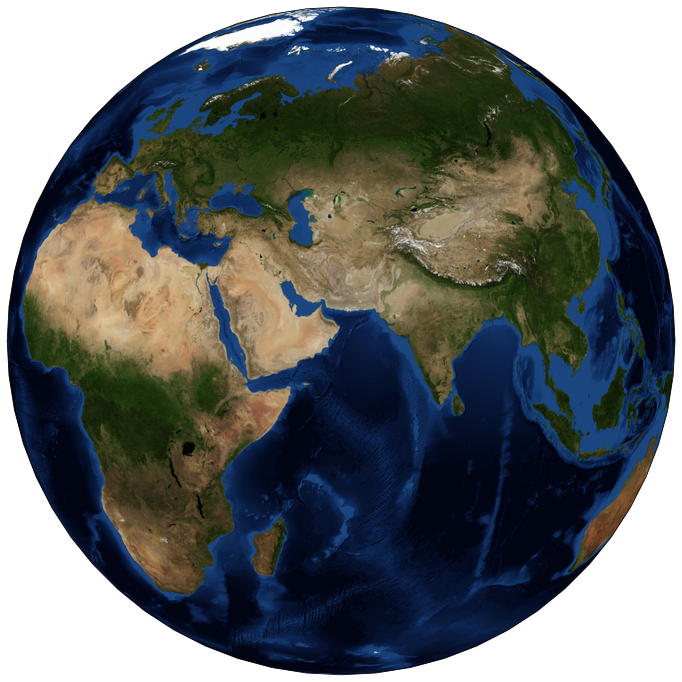

Processing ortho [70, 20]	filename: ./output/july_70_earth.png


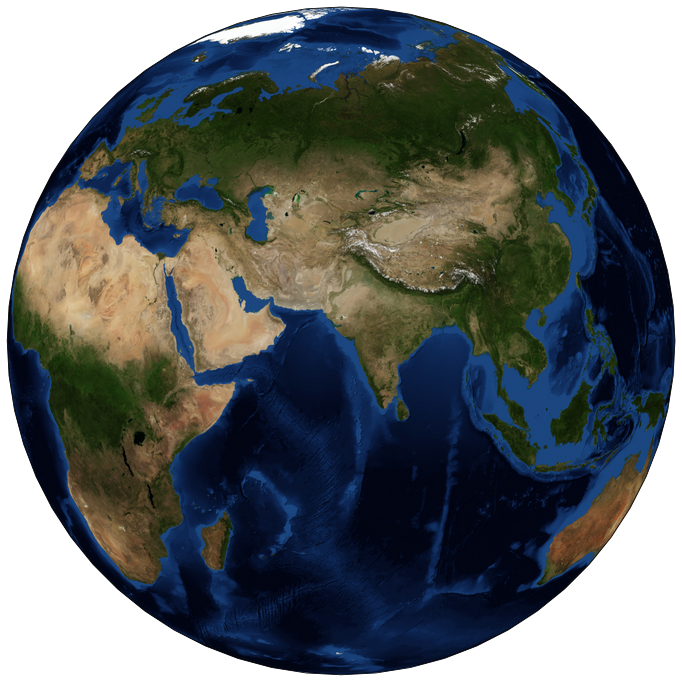

Processing ortho [80, 20]	filename: ./output/july_80_earth.png


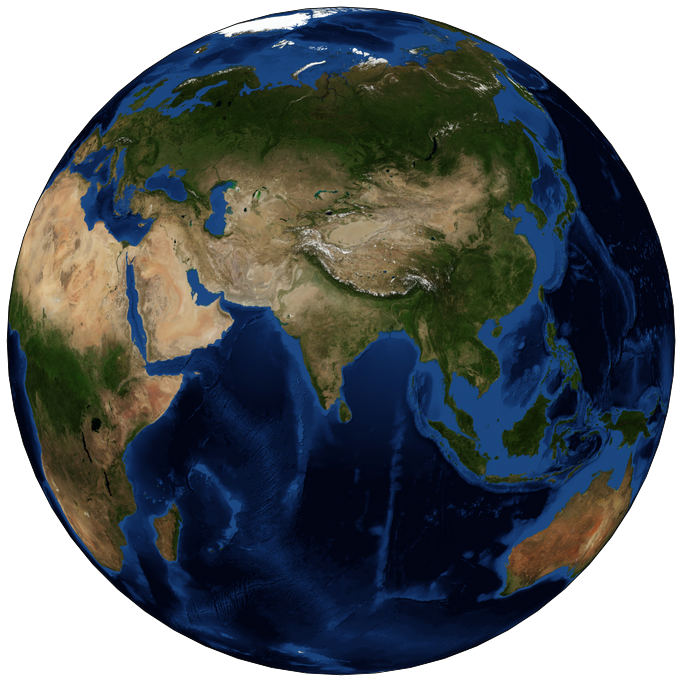

Processing ortho [90, 20]	filename: ./output/july_90_earth.png


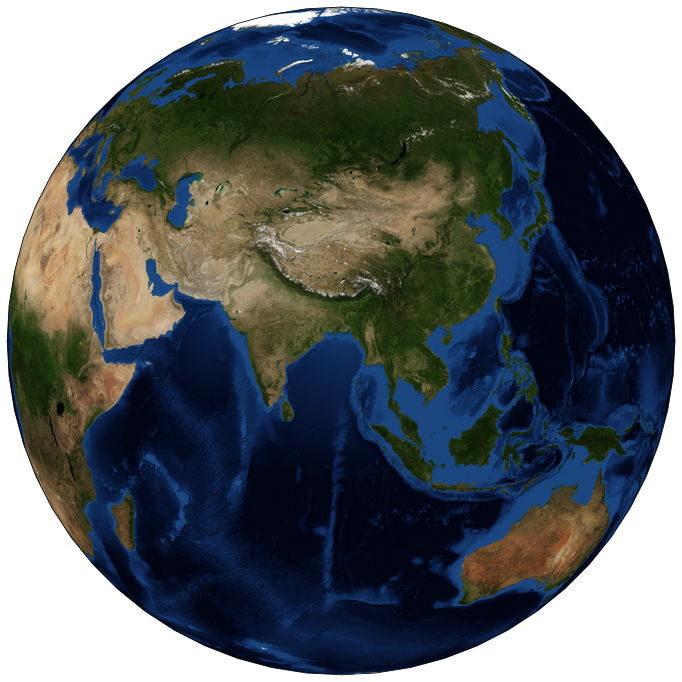

Processing ortho [100, 20]	filename: ./output/july_100_earth.png


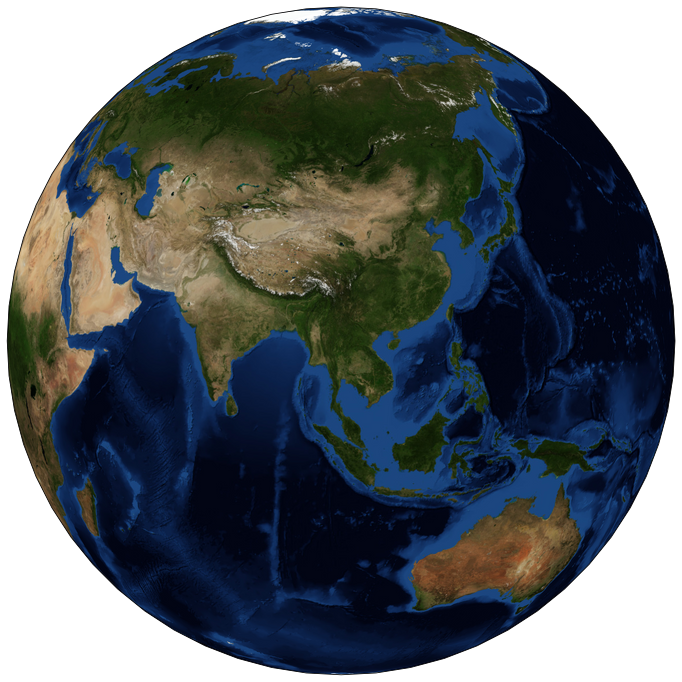

Processing ortho [110, 20]	filename: ./output/july_110_earth.png


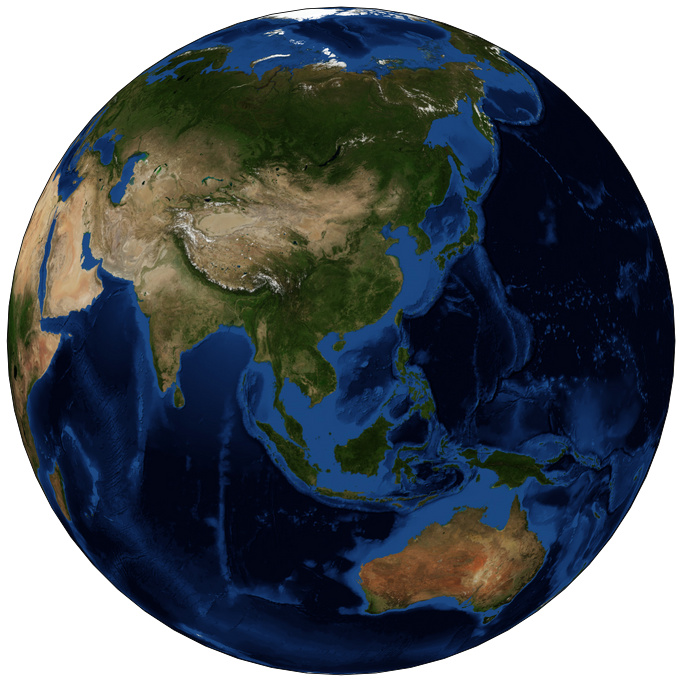

Finished with file for: july


In [29]:
# PLOT RASTER IMAGES FOR LARGE EARTH IMAGE AT CENTER

filenames = glob.glob(DIR_RAW_INPUT + "*.png")

for readname in filenames: 
    month = readname.split("/")[-1].split("\\")[-1].split("_")[0]

    for i in range(0,eastrange,10):
        longtitude = (i + startingLon) % 360
        ortho = [longtitude, 20]
        
        savename =DIR_OUTPUT + month + '_' + str(longtitude) + '_earth.png'
        print("Processing ortho " + str(ortho) + "\tfilename: " + savename)
        fig = plt.figure(figsize=figsize)
        ax = plt.axes(projection=ccrs.Orthographic(*ortho))
        img = plt.imread(readname)
        ax.imshow(img, origin='upper', extent=img_extent, transform=ccrs.PlateCarree(), 
                  interpolation='spline36', regrid_shape=4000)
        set_save_image(fig, savename, show=True)

    print("Finished with file for:", month)